In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad

# 读取数据
print("Loading data...")
# 读取npz文件中的嵌入数据
decomp_data = np.load('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/total_decomp.npz')
X = decomp_data['arr_0']  # 形状: (7469, 20)

Loading data...


In [2]:
# 读取细胞标签
cell_labels = pd.read_csv('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/cell_labels.csv')

print(f"Embedding shape: {X.shape}")
print(f"Cell labels shape: {cell_labels.shape}")
print(f"Cell labels columns: {cell_labels.columns.tolist()}")



Embedding shape: (7469, 20)
Cell labels shape: (7469, 4)
Cell labels columns: ['cell_id', 'cellname', 'stage', 'celltype']


In [3]:
# 创建AnnData对象
adata = ad.AnnData(X=X)

# 设置观察值（细胞信息）
adata.obs = cell_labels.set_index('cell_id')

# 设置变量名（嵌入维度）
adata.var_names = [f'PC{i+1}' for i in range(X.shape[1])]

# 设置一些基本属性
adata.obs_names.name = 'cell_id'
adata.var_names.name = 'embedding_dimensions'

# 添加一些元数据
adata.uns['description'] = 'SVD embedding of Hi-C data'
adata.uns['embedding_method'] = 'SVD'
adata.uns['n_components'] = X.shape[1]

print("AnnData object created:")
print(adata)
print(f"Obs columns: {adata.obs.columns.tolist()}")

AnnData object created:
AnnData object with n_obs × n_vars = 7469 × 20
    obs: 'cellname', 'stage', 'celltype'
    uns: 'description', 'embedding_method', 'n_components'
Obs columns: ['cellname', 'stage', 'celltype']


In [4]:
# 保存为h5ad文件
output_path = '/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad'
adata.write_h5ad(output_path)
print(f"Data saved to: {output_path}")

# 验证保存的文件
print("\nVerifying saved file...")
adata_loaded = ad.read_h5ad(output_path)
print(f"Loaded data shape: {adata_loaded.shape}")
print(f"Loaded obs columns: {adata_loaded.obs.columns.tolist()}")

Data saved to: /home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad

Verifying saved file...
Loaded data shape: (7469, 20)
Loaded obs columns: ['cellname', 'stage', 'celltype']


In [10]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd

# 读取h5ad文件
adata = sc.read_h5ad('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad')

# 1. 准备嵌入数据（对应R中的sch_embedding）
sch_embedding = adata.X.copy()  # 形状: (7469, 20)

# 2. 设置行名为细胞名称（对应rownames(sch_embedding) <- colnames(hires)）
# 在AnnData中，obs_names已经是细胞名称，所以不需要额外设置

# 3. 将嵌入数据存储到obsm中（对应CreateDimReducObject）
adata.obsm['X_schicluster'] = sch_embedding

# 4. 构建邻居图（对应FindNeighbors）
sc.pp.neighbors(adata, 
                use_rep='X_schicluster',  # 使用schicluster嵌入
                n_neighbors=15,           # 对应dims=1:15
                key_added='schicluster')  # 对应graph.name="sch.nn"

# 5. 聚类（对应FindClusters）
sc.tl.leiden(adata, 
             resolution=0.5,              # 默认分辨率
             key_added='schicluster_clusters',
             neighbors_key='schicluster') # 使用schicluster的邻居图

print("Analysis completed!")
print(f"Available embeddings: {list(adata.obsm.keys())}")
print(f"Available neighbor graphs: {list(adata.obsp.keys())}")

Analysis completed!
Available embeddings: ['X_schicluster']
Available neighbor graphs: ['schicluster_distances', 'schicluster_connectivities']


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


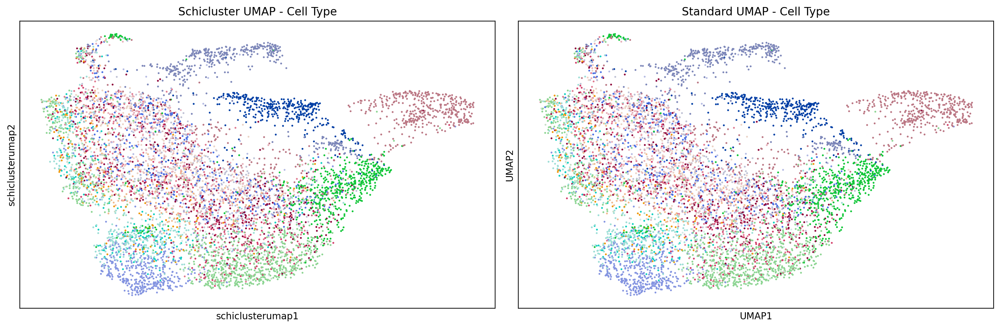

In [16]:
import matplotlib.pyplot as plt

# 设置图形参数
plt.rcParams['figure.figsize'] = (15, 5)
plt.rcParams['figure.dpi'] = 200

# 创建子图
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# 第一个图：Schicluster UMAP - 使用sc.pl.embedding
sc.pl.embedding(adata, 
                basis='schiclusterumap',  # 使用schiclusterumap嵌入
                color='celltype',
                ax=axes[0],
                show=False,
                legend_loc='none',
                title='Schicluster UMAP - Cell Type')

# 第二个图：标准UMAP
sc.pl.umap(adata, 
           color='celltype',
           ax=axes[1],
           show=False,
           legend_loc='none',
           title='Standard UMAP - Cell Type')

plt.tight_layout()
plt.show()

Building neighborhood graph using X matrix...
Performing clustering...
Running UMAP...


TypeError: pca() got an unexpected keyword argument 'min_dist'

Stages: ['E75', 'E70', 'E80', 'E95', 'EX15', 'E85', 'EX05']
Categories (7, object): ['E70', 'E75', 'E80', 'E85', 'E95', 'EX05', 'EX15']


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/h

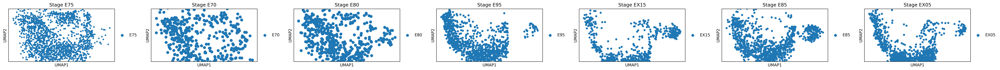

In [24]:
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load the h5ad file
adata = sc.read_h5ad('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad')

# Compute UMAP embedding
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata)

# Get unique stages
stages = adata.obs['stage'].unique()
print(f'Stages: {stages}')

# Create UMAP plots for each stage with 1:2 aspect ratio
fig, axes = plt.subplots(1, len(stages), figsize=(5*len(stages), 2.5*len(stages)))  # 调整整体比例
if len(stages) == 1:
    axes = [axes]

for i, stage in enumerate(stages):
    # Create a mask for the current stage
    mask = adata.obs['stage'] == stage
    # Plot UMAP for the current stage
    sc.pl.umap(adata[mask], color='stage', ax=axes[i], show=False, title=f'Stage {stage}')
    
    # 设置每个子图的aspect ratio为1:2
    axes[i].set_aspect('equal', adjustable='box')
    # 手动设置x和y轴的范围比例
    xlim = axes[i].get_xlim()
    ylim = axes[i].get_ylim()
    x_range = xlim[1] - xlim[0]
    y_range = ylim[1] - ylim[0]
    
    # 调整y轴范围使其为x轴范围的1/2
    y_center = (ylim[0] + ylim[1]) / 2
    new_y_range = x_range / 2
    axes[i].set_ylim(y_center - new_y_range/2, y_center + new_y_range/2)

plt.tight_layout()
# plt.savefig('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/stage_umap_subplots_2_1_ratio.png', dpi=300, bbox_inches='tight')
# print('Stage-based UMAP subplots with 1:2 aspect ratio created successfully!')

Stages: ['E75', 'E70', 'E80', 'E95', 'EX15', 'E85', 'EX05']
Categories (7, object): ['E70', 'E75', 'E80', 'E85', 'E95', 'EX05', 'EX15']


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/h

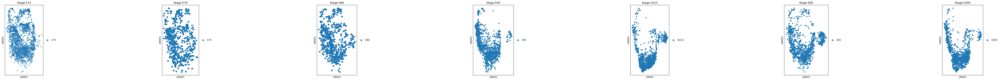

In [26]:
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load the h5ad file
adata = sc.read_h5ad('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad')

# Compute UMAP embedding
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata)

# Get unique stages
stages = adata.obs['stage'].unique()
print(f'Stages: {stages}')

# Create UMAP plots for each stage with 2:1 aspect ratio
fig, axes = plt.subplots(1, len(stages), figsize=(10*len(stages), 5))  # 2:1的宽高比
if len(stages) == 1:
    axes = [axes]

for i, stage in enumerate(stages):
    # Create a mask for the current stage
    mask = adata.obs['stage'] == stage
    # Plot UMAP for the current stage
    sc.pl.umap(adata[mask], color='stage', ax=axes[i], show=False, title=f'Stage {stage}')
    
    # 设置aspect ratio为2:1 (x:y = 2:1)
    axes[i].set_aspect(2.0)  # aspect = y/x = 1/2 = 0.5, 所以设置为2.0

plt.tight_layout()
# plt.savefig('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/stage_umap_subplots_2_1_ratio.png', dpi=300, bbox_inches='tight')
# print('Stage-based UMAP subplots with 2:1 aspect ratio created successfully!')

Computing neighbors and UMAP embedding...
Stages: ['E70', 'E75', 'E80', 'E85', 'E95', 'EX05', 'EX15']
Cell types: 21 unique types
Stage-based UMAP subplots colored by cell type saved to: /home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/stage_umap_subplots_by_celltype.png


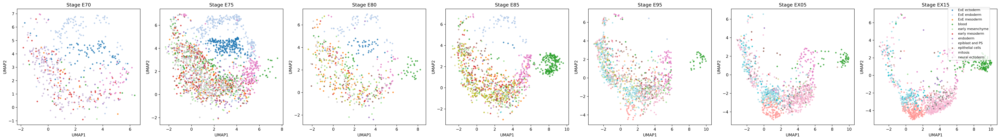

In [27]:
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

# Load the h5ad file
adata = sc.read_h5ad('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad')

# Compute neighbors and UMAP embedding if not already computed
if 'X_umap' not in adata.obsm:
    print("Computing neighbors and UMAP embedding...")
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)
    sc.tl.umap(adata)

# Get unique stages and cell types
stages = sorted(adata.obs['stage'].unique())
cell_types = sorted(adata.obs['celltype'].unique())
print(f"Stages: {stages}")
print(f"Cell types: {len(cell_types)} unique types")

# Create a color map for cell types
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
colors = cm.tab20(np.linspace(0, 1, len(cell_types)))
cell_type_colors = dict(zip(cell_types, colors))

# Create UMAP plots for each stage, colored by cell type
fig, axes = plt.subplots(1, len(stages), figsize=(5*len(stages), 5))
if len(stages) == 1:
    axes = [axes]
elif len(stages) == 0:
    print("No stages found in data")
    exit()

# Plot for each stage
for i, stage in enumerate(stages):
    # Create a mask for the current stage
    mask = adata.obs['stage'] == stage

    # Plot each cell type with its specific color
    for cell_type in cell_types:
        cell_mask = (adata.obs['stage'] == stage) & (adata.obs['celltype'] == cell_type)
        if np.sum(cell_mask) > 0:  # Only plot if there are cells of this type
            axes[i].scatter(
                adata.obsm['X_umap'][cell_mask, 0],
                adata.obsm['X_umap'][cell_mask, 1],
                c=[cell_type_colors[cell_type]],
                s=8, alpha=0.7, label=cell_type
            )

    axes[i].set_title(f'Stage {stage}')
    axes[i].set_xlabel('UMAP1')
    axes[i].set_ylabel('UMAP2')

# Add legend to the figure
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.99, 0.95), fontsize=8)

plt.tight_layout()
output_path = '/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/stage_umap_subplots_by_celltype.png'
# plt.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"Stage-based UMAP subplots colored by cell type saved to: {output_path}")
plt.show()

Computing neighbors and UMAP embedding...
Stages: ['E70', 'E75', 'E80', 'E85', 'E95', 'EX05', 'EX15']
Cell types: 21 unique types


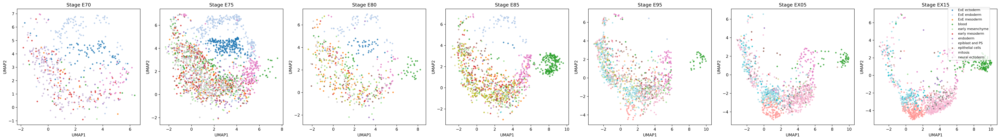

In [31]:
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

# Load the h5ad file
adata = sc.read_h5ad('/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/embedding_data.h5ad')

# Compute neighbors and UMAP embedding if not already computed
if 'X_umap' not in adata.obsm:
    print("Computing neighbors and UMAP embedding...")
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)
    sc.tl.umap(adata)

# Get unique stages and cell types
stages = sorted(adata.obs['stage'].unique())
cell_types = sorted(adata.obs['celltype'].unique())
print(f"Stages: {stages}")
print(f"Cell types: {len(cell_types)} unique types")

# Create a color map for cell types
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
colors = cm.tab20(np.linspace(0, 1, len(cell_types)))
cell_type_colors = dict(zip(cell_types, colors))

# Create UMAP plots for each stage, colored by cell type
fig, axes = plt.subplots(1, len(stages), figsize=(5*len(stages), 5))
if len(stages) == 1:
    axes = [axes]
elif len(stages) == 0:
    print("No stages found in data")
    exit()

# Plot for each stage
for i, stage in enumerate(stages):
    # Create a mask for the current stage
    mask = adata.obs['stage'] == stage

    # Plot each cell type with its specific color
    for cell_type in cell_types:
        cell_mask = (adata.obs['stage'] == stage) & (adata.obs['celltype'] == cell_type)
        if np.sum(cell_mask) > 0:  # Only plot if there are cells of this type
            axes[i].scatter(
                adata.obsm['X_umap'][cell_mask, 0],
                adata.obsm['X_umap'][cell_mask, 1],
                c=[cell_type_colors[cell_type]],
                s=8, alpha=0.7, label=cell_type
            )

    axes[i].set_title(f'Stage {stage}')
    axes[i].set_xlabel('UMAP1')
    axes[i].set_ylabel('UMAP2')

# Add legend to the figure
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.99, 0.95), fontsize=8)

plt.tight_layout()
# output_path = '/home/duxuyan/Projects/schicluster_mac/31_svd_embedding/output/decomp/stage_umap_subplots_by_celltype.png'
# plt.savefig(output_path, dpi=300, bbox_inches='tight')
# print(f"Stage-based UMAP subplots colored by cell type saved to: {output_path}")
plt.show()

Loading data...
Computing 2D embedding using umap-learn...
Computation complete.
Generating plot...


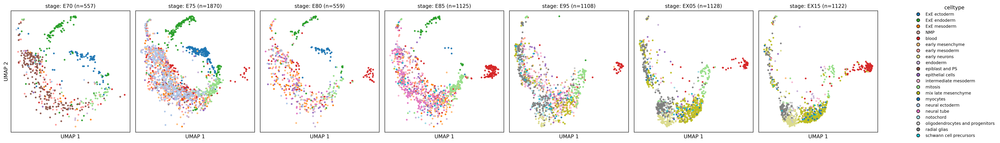

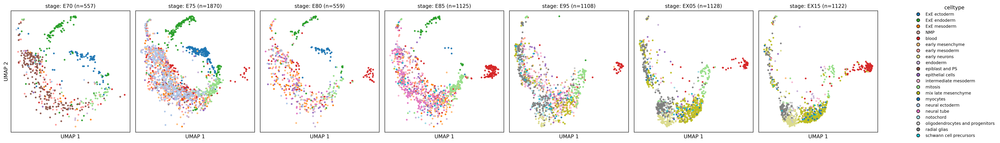

In [30]:
#!/usr/bin/env python3
"""
UMAP plot colored by celltype and split by stage.
This script is adapted for execution in a Jupyter Notebook.
"""
# -----------------------------------------------------------------------------
# CELL 1: Imports
# -----------------------------------------------------------------------------
from __future__ import annotations
import json
from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import pandas as pd

# Prefer umap-learn; fallback to sklearn if needed
try:
    import umap
    UMAPImpl = 'umap-learn'
except ImportError:  # pragma: no cover
    umap = None
    from sklearn.manifold import TSNE  # type: ignore
    UMAPImpl = 'sklearn-TSNE'
    print("[info] umap-learn not found. Falling back to sklearn.manifold.TSNE.")
    print("[info] To install umap-learn, run: pip install umap-learn")


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors
from pathlib import Path

# -----------------------------------------------------------------------------
# CELL 2: Configuration and Parameters
# All settings that were previously command-line arguments are defined here.
# -----------------------------------------------------------------------------

# --- Paths ---
# Manually specify the root directory for your project
ROOT = Path("/home/duxuyan/Projects/schicluster_mac/31_svd_embedding").resolve()
DECOMP_DIR = ROOT / "output" / "decomp"
PLOT_OUT_DIR = ROOT / "plot" / "output"

# Input files
DEFAULT_EMBED_PATH = DECOMP_DIR / "total_decomp.npz"
LABELS_PATH = DECOMP_DIR / "cell_labels.csv"
CELL_TABLE_PATH = ROOT / "code" / "cell_table.tsv"
STAGE_MAP_PATH = Path(ROOT).parents[1] / "stage_files_mapping.csv"
COLOR_MAP_JSON = Path(ROOT).parents[1] / "5_plot_umap" / "color_mapping.json"

# --- UMAP/t-SNE Parameters ---
embedding_path = DEFAULT_EMBED_PATH
n_neighbors = 15
min_dist = 0.1

# --- Plotting Parameters ---
out_prefix = PLOT_OUT_DIR / "umap_celltype_split_stage"
point_size = 6.0
alpha = 0.9

# -----------------------------------------------------------------------------
# CELL 3: Helper Functions
# -----------------------------------------------------------------------------

def ensure_labels(labels_csv: Path = LABELS_PATH) -> pd.DataFrame:
    """Loads cell labels from CSV, or builds it from source files if it doesn't exist."""
    labels_csv.parent.mkdir(parents=True, exist_ok=True)
    if labels_csv.exists():
        df = pd.read_csv(labels_csv)
        needed = {"cell_id", "cellname", "stage", "celltype"}
        if needed.issubset(df.columns):
            return df
        # else rebuild if columns are missing

    print(f"'{labels_csv.name}' not found or is malformed. Rebuilding from source files...")
    # Build labels from sources
    cell_tbl = pd.read_csv(CELL_TABLE_PATH, sep='\t', header=None, names=["cell_id", "extra"], dtype=str)
    if "cell_id" not in cell_tbl.columns:
        raise RuntimeError(f"Unexpected cell_table format at {CELL_TABLE_PATH}")
    cell_tbl["cellname"] = cell_tbl["cell_id"]

    if not STAGE_MAP_PATH.exists():
        raise FileNotFoundError(f"Missing stage mapping CSV at {STAGE_MAP_PATH}")
    stage_map = pd.read_csv(STAGE_MAP_PATH)
    if "cellname" not in stage_map.columns:
        raise RuntimeError("stage_files_mapping.csv must contain 'cellname' column")

    merged = cell_tbl.merge(stage_map[["cellname", "stage", "celltype"]], on="cellname", how="left")
    missing = merged["celltype"].isna().sum()
    if missing > 0:
        print(f"[warn] {missing} rows missing celltype after merge; filling as 'unknown'")
        merged["celltype"].fillna("unknown", inplace=True)
    merged.to_csv(labels_csv, index=False)
    print(f"Labels successfully built and saved to '{labels_csv.name}'")
    return merged


def load_embeddings(npz_path: Path = DEFAULT_EMBED_PATH) -> np.ndarray:
    """Loads the embedding matrix from an .npz file."""
    if not npz_path.exists():
        raise FileNotFoundError(f"Embedding file not found: {npz_path}")
    with np.load(npz_path) as data:
        # Accept 'arr_0' or 'X' style keys for flexibility
        key = 'X' if 'X' in data.files else 'arr_0'
        X = data[key]
    if X.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {X.shape}")
    return X


def load_color_map() -> Dict[str, str]:
    """Loads a preferred color mapping from a JSON file if it exists."""
    if COLOR_MAP_JSON.exists():
        try:
            with open(COLOR_MAP_JSON, 'r') as f:
                cmap = json.load(f)
            # Handle nested dictionary format
            if isinstance(cmap, dict) and 'celltype' in cmap and isinstance(cmap['celltype'], dict):
                return cmap['celltype']
            if isinstance(cmap, dict) and all(isinstance(v, str) for v in cmap.values()):
                return cmap  # Simple mapping
        except Exception as e:
            print(f"[warn] Failed to read or parse color mapping JSON: {e}")
    return {} # Return empty dict if file doesn't exist or fails


def get_palette(categories: pd.Index, pref_map: Dict[str, str]) -> Dict[str, str]:
    """Generates a color palette, using a preferred map for specified categories."""
    cats = list(categories)
    palette = {}
    # Apply preferred mapping first
    palette.update(pref_map)
    # Generate colors for any remaining categories
    unmapped = [c for c in cats if c not in palette]
    if len(unmapped) > 0:
        # Use a well-distinguishable color palette
        colors = sns.color_palette("tab20", n_colors=max(20, len(unmapped)))
        for c, col in zip(unmapped, colors):
            palette[c] = mcolors.to_hex(col)
    return palette


def compute_2d(X: np.ndarray, n_neighbors: int, min_dist: float, random_state: int = 42) -> np.ndarray:
    """Computes 2D coordinates using UMAP or falls back to t-SNE."""
    print(f"Computing 2D embedding using {UMAPImpl}...")
    if umap is not None:
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
        coords = reducer.fit_transform(X)
    else:
        # Fallback to t-SNE if umap-learn is not installed
        tsne = TSNE(n_components=2, random_state=random_state, init='pca', learning_rate='auto', perplexity=min(30, X.shape[0]-1))
        coords = tsne.fit_transform(X)
    print("Computation complete.")
    return coords


def plot_umap_split_by_stage(
    coords: np.ndarray,
    labels: pd.DataFrame,
    color_by: str = "celltype",
    split_by: str = "stage",
    point_size: float = 6.0,
    alpha: float = 0.9,
    figsize: Tuple[int, int] = (14, 4),
    color_map: Optional[Dict[str, str]] = None,
) -> Tuple[plt.Figure, plt.Axes]:
    """Plots the UMAP, faceted by stage, and returns the figure object."""
    df = labels.copy().reset_index(drop=True)
    df["DIM1"], df["DIM2"] = coords[:, 0], coords[:, 1]
    dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "t-SNE"

    stages = sorted(df[split_by].dropna().unique().tolist())
    n_stage = len(stages)
    nrows, ncols = 1, max(1, n_stage)
    panel_w = max(3.5, min(5.0, figsize[0] / max(1, ncols)))
    figsize = (panel_w * ncols, figsize[1])

    if color_map is None:
        color_map = {}
    palette = get_palette(df[color_by].astype(str).unique(), color_map)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    for i, stage in enumerate(stages):
        ax = axes[i]
        sub = df[df[split_by] == stage]
        for ct, sub2 in sub.groupby(color_by):
            ax.scatter(sub2["DIM1"], sub2["DIM2"], s=point_size, alpha=alpha, c=palette.get(str(ct), "#888888"), label=str(ct))
        ax.set_title(f"{split_by}: {stage} (n={len(sub)})", fontsize=10)
        ax.set_xlabel(f"{dim_prefix} 1")
        if i == 0:
            ax.set_ylabel(f"{dim_prefix} 2")
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Create a single global legend
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], marker='o', color='none', label=lab, markerfacecolor=col, markersize=6)
               for lab, col in sorted(palette.items())] # Sort for consistent order

    fig.legend(handles=handles, title=color_by,
               loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False, fontsize=8)

    plt.tight_layout(rect=[0, 0, 0.98, 1])

    return fig, axes


# -----------------------------------------------------------------------------
# CELL 4: Main Execution Block
# -----------------------------------------------------------------------------

# Ensure the output directory exists
PLOT_OUT_DIR.mkdir(parents=True, exist_ok=True)

# 1. Load data
print("Loading data...")
labels_df = ensure_labels(LABELS_PATH)
embedding_matrix = load_embeddings(embedding_path)

if len(labels_df) != embedding_matrix.shape[0]:
    raise ValueError(f"Row count mismatch: labels {len(labels_df)} vs embedding {embedding_matrix.shape[0]}")

# 2. Compute 2D coordinates
coordinates = compute_2d(embedding_matrix, n_neighbors=n_neighbors, min_dist=min_dist)

# 3. Load preferred colors
preferred_colors = load_color_map()

# 4. Plot the results
print("Generating plot...")
fig, _ = plot_umap_split_by_stage(
    coordinates,
    labels_df,
    color_by="celltype",
    split_by="stage",
    point_size=point_size,
    alpha=alpha,
    color_map=preferred_colors
)

# 5. Save the output files
# out_png = Path(out_prefix).with_suffix('.png')
# out_pdf = Path(out_prefix).with_suffix('.pdf')
# out_csv = Path(out_prefix).with_suffix('.csv')

# fig.savefig(out_png, dpi=300, bbox_inches='tight')
# fig.savefig(out_pdf, bbox_inches='tight')

# out_df = labels_df.copy()
# dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "tSNE"
# out_df[f"{dim_prefix}1"] = coordinates[:, 0]
# out_df[f"{dim_prefix}2"] = coordinates[:, 1]
# out_df.to_csv(out_csv, index=False)

# print(f"\nOutputs successfully saved:")
# print(f"  - Plot (PNG): {out_png}")
# print(f"  - Plot (PDF): {out_pdf}")
# print(f"  - Coordinates (CSV): {out_csv}")

# 6. Display the plot directly in the notebook output
# In a Jupyter cell, having the figure object as the last line will render it.
fig


## 去除 umap 子图中的上边框和右边框线

Loading data...
Computing 2D embedding using umap-learn...


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computation complete.
Generating plot...


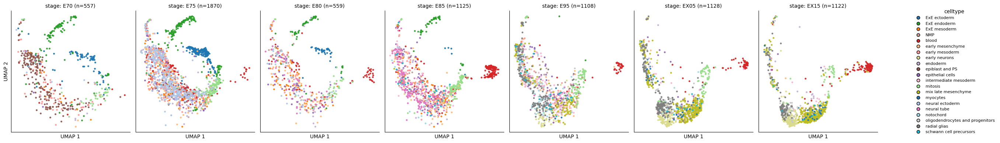

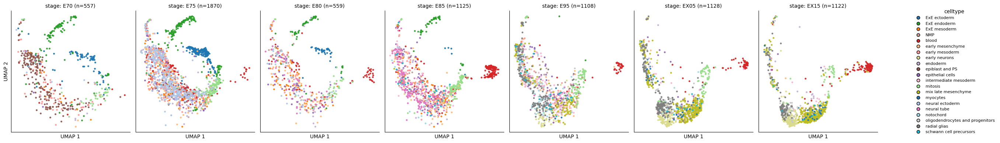

In [1]:
#!/usr/bin/env python3
"""
UMAP plot colored by celltype and split by stage.
This script is adapted for execution in a Jupyter Notebook.
"""
# -----------------------------------------------------------------------------
# CELL 1: Imports
# -----------------------------------------------------------------------------
from __future__ import annotations
import json
from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import pandas as pd

# Prefer umap-learn; fallback to sklearn if needed
try:
    import umap
    UMAPImpl = 'umap-learn'
except ImportError:  # pragma: no cover
    umap = None
    from sklearn.manifold import TSNE  # type: ignore
    UMAPImpl = 'sklearn-TSNE'
    print("[info] umap-learn not found. Falling back to sklearn.manifold.TSNE.")
    print("[info] To install umap-learn, run: pip install umap-learn")


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors
from pathlib import Path

# -----------------------------------------------------------------------------
# CELL 2: Configuration and Parameters
# All settings that were previously command-line arguments are defined here.
# -----------------------------------------------------------------------------

# --- Paths ---
# Manually specify the root directory for your project
ROOT = Path("/home/duxuyan/Projects/schicluster_mac/31_svd_embedding").resolve()
DECOMP_DIR = ROOT / "output" / "decomp"
PLOT_OUT_DIR = ROOT / "plot" / "output"

# Input files
DEFAULT_EMBED_PATH = DECOMP_DIR / "total_decomp.npz"
LABELS_PATH = DECOMP_DIR / "cell_labels.csv"
CELL_TABLE_PATH = ROOT / "code" / "cell_table.tsv"
STAGE_MAP_PATH = Path(ROOT).parents[1] / "stage_files_mapping.csv"
COLOR_MAP_JSON = Path(ROOT).parents[1] / "5_plot_umap" / "color_mapping.json"

# --- UMAP/t-SNE Parameters ---
embedding_path = DEFAULT_EMBED_PATH
n_neighbors = 15
min_dist = 0.1

# --- Plotting Parameters ---
out_prefix = PLOT_OUT_DIR / "umap_celltype_split_stage"
point_size = 6.0
alpha = 0.9

# -----------------------------------------------------------------------------
# CELL 3: Helper Functions
# -----------------------------------------------------------------------------

def ensure_labels(labels_csv: Path = LABELS_PATH) -> pd.DataFrame:
    """Loads cell labels from CSV, or builds it from source files if it doesn't exist."""
    labels_csv.parent.mkdir(parents=True, exist_ok=True)
    if labels_csv.exists():
        df = pd.read_csv(labels_csv)
        needed = {"cell_id", "cellname", "stage", "celltype"}
        if needed.issubset(df.columns):
            return df
        # else rebuild if columns are missing

    print(f"'{labels_csv.name}' not found or is malformed. Rebuilding from source files...")
    # Build labels from sources
    cell_tbl = pd.read_csv(CELL_TABLE_PATH, sep='\t', header=None, names=["cell_id", "extra"], dtype=str)
    if "cell_id" not in cell_tbl.columns:
        raise RuntimeError(f"Unexpected cell_table format at {CELL_TABLE_PATH}")
    cell_tbl["cellname"] = cell_tbl["cell_id"]

    if not STAGE_MAP_PATH.exists():
        raise FileNotFoundError(f"Missing stage mapping CSV at {STAGE_MAP_PATH}")
    stage_map = pd.read_csv(STAGE_MAP_PATH)
    if "cellname" not in stage_map.columns:
        raise RuntimeError("stage_files_mapping.csv must contain 'cellname' column")

    merged = cell_tbl.merge(stage_map[["cellname", "stage", "celltype"]], on="cellname", how="left")
    missing = merged["celltype"].isna().sum()
    if missing > 0:
        print(f"[warn] {missing} rows missing celltype after merge; filling as 'unknown'")
        merged["celltype"].fillna("unknown", inplace=True)
    merged.to_csv(labels_csv, index=False)
    print(f"Labels successfully built and saved to '{labels_csv.name}'")
    return merged


def load_embeddings(npz_path: Path = DEFAULT_EMBED_PATH) -> np.ndarray:
    """Loads the embedding matrix from an .npz file."""
    if not npz_path.exists():
        raise FileNotFoundError(f"Embedding file not found: {npz_path}")
    with np.load(npz_path) as data:
        # Accept 'arr_0' or 'X' style keys for flexibility
        key = 'X' if 'X' in data.files else 'arr_0'
        X = data[key]
    if X.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {X.shape}")
    return X


def load_color_map() -> Dict[str, str]:
    """Loads a preferred color mapping from a JSON file if it exists."""
    if COLOR_MAP_JSON.exists():
        try:
            with open(COLOR_MAP_JSON, 'r') as f:
                cmap = json.load(f)
            # Handle nested dictionary format
            if isinstance(cmap, dict) and 'celltype' in cmap and isinstance(cmap['celltype'], dict):
                return cmap['celltype']
            if isinstance(cmap, dict) and all(isinstance(v, str) for v in cmap.values()):
                return cmap  # Simple mapping
        except Exception as e:
            print(f"[warn] Failed to read or parse color mapping JSON: {e}")
    return {} # Return empty dict if file doesn't exist or fails


def get_palette(categories: pd.Index, pref_map: Dict[str, str]) -> Dict[str, str]:
    """Generates a color palette, using a preferred map for specified categories."""
    cats = list(categories)
    palette = {}
    # Apply preferred mapping first
    palette.update(pref_map)
    # Generate colors for any remaining categories
    unmapped = [c for c in cats if c not in palette]
    if len(unmapped) > 0:
        # Use a well-distinguishable color palette
        colors = sns.color_palette("tab20", n_colors=max(20, len(unmapped)))
        for c, col in zip(unmapped, colors):
            palette[c] = mcolors.to_hex(col)
    return palette


def compute_2d(X: np.ndarray, n_neighbors: int, min_dist: float, random_state: int = 42) -> np.ndarray:
    """Computes 2D coordinates using UMAP or falls back to t-SNE."""
    print(f"Computing 2D embedding using {UMAPImpl}...")
    if umap is not None:
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
        coords = reducer.fit_transform(X)
    else:
        # Fallback to t-SNE if umap-learn is not installed
        tsne = TSNE(n_components=2, random_state=random_state, init='pca', learning_rate='auto', perplexity=min(30, X.shape[0]-1))
        coords = tsne.fit_transform(X)
    print("Computation complete.")
    return coords


def plot_umap_split_by_stage(
    coords: np.ndarray,
    labels: pd.DataFrame,
    color_by: str = "celltype",
    split_by: str = "stage",
    point_size: float = 6.0,
    alpha: float = 0.9,
    figsize: Tuple[int, int] = (14, 4),
    color_map: Optional[Dict[str, str]] = None,
) -> Tuple[plt.Figure, plt.Axes]:
    """Plots the UMAP, faceted by stage, and returns the figure object."""
    df = labels.copy().reset_index(drop=True)
    df["DIM1"], df["DIM2"] = coords[:, 0], coords[:, 1]
    dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "t-SNE"

    stages = sorted(df[split_by].dropna().unique().tolist())
    n_stage = len(stages)
    nrows, ncols = 1, max(1, n_stage)
    panel_w = max(3.5, min(5.0, figsize[0] / max(1, ncols)))
    figsize = (panel_w * ncols, figsize[1])

    if color_map is None:
        color_map = {}
    palette = get_palette(df[color_by].astype(str).unique(), color_map)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    for i, stage in enumerate(stages):
        ax = axes[i]
        sub = df[df[split_by] == stage]
        for ct, sub2 in sub.groupby(color_by):
            ax.scatter(sub2["DIM1"], sub2["DIM2"], s=point_size, alpha=alpha, c=palette.get(str(ct), "#888888"), label=str(ct))
        ax.set_title(f"{split_by}: {stage} (n={len(sub)})", fontsize=10)
        ax.set_xlabel(f"{dim_prefix} 1")
        if i == 0:
            ax.set_ylabel(f"{dim_prefix} 2")
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)

        # Remove top and right spines for a cleaner look
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Create a single global legend
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], marker='o', color='none', label=lab, markerfacecolor=col, markersize=6)
               for lab, col in sorted(palette.items())] # Sort for consistent order

    fig.legend(handles=handles, title=color_by,
               loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False, fontsize=8)

    plt.tight_layout(rect=[0, 0, 0.98, 1])

    return fig, axes


# -----------------------------------------------------------------------------
# CELL 4: Main Execution Block
# -----------------------------------------------------------------------------

# Ensure the output directory exists
PLOT_OUT_DIR.mkdir(parents=True, exist_ok=True)

# 1. Load data
print("Loading data...")
labels_df = ensure_labels(LABELS_PATH)
embedding_matrix = load_embeddings(embedding_path)

if len(labels_df) != embedding_matrix.shape[0]:
    raise ValueError(f"Row count mismatch: labels {len(labels_df)} vs embedding {embedding_matrix.shape[0]}")

# 2. Compute 2D coordinates
coordinates = compute_2d(embedding_matrix, n_neighbors=n_neighbors, min_dist=min_dist)

# 3. Load preferred colors
preferred_colors = load_color_map()

# 4. Plot the results
print("Generating plot...")
fig, _ = plot_umap_split_by_stage(
    coordinates,
    labels_df,
    color_by="celltype",
    split_by="stage",
    point_size=point_size,
    alpha=alpha,
    color_map=preferred_colors
)

# 5. Save the output files
# out_png = Path(out_prefix).with_suffix('.png')
# out_pdf = Path(out_prefix).with_suffix('.pdf')
# out_csv = Path(out_prefix).with_suffix('.csv')

# fig.savefig(out_png, dpi=300, bbox_inches='tight')
# fig.savefig(out_pdf, bbox_inches='tight')

# out_df = labels_df.copy()
# dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "tSNE"
# out_df[f"{dim_prefix}1"] = coordinates[:, 0]
# out_df[f"{dim_prefix}2"] = coordinates[:, 1]
# out_df.to_csv(out_csv, index=False)

# print(f"\nOutputs successfully saved:")
# print(f"  - Plot (PNG): {out_png}")
# print(f"  - Plot (PDF): {out_pdf}")
# print(f"  - Coordinates (CSV): {out_csv}")

# 6. Display the plot directly in the notebook output
# In a Jupyter cell, having the figure object as the last line will render it.
fig



## 为每个 UMAP 子图的标题添加了灰色背景。

Loading data...
Computing 2D embedding using umap-learn...


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computation complete.
Generating plot...

Outputs successfully saved:
  - Plot (PNG): /home/duxuyan/Projects/schicluster_mac/31_svd_embedding/plot/output/umap_celltype_split_stage.png
  - Plot (PDF): /home/duxuyan/Projects/schicluster_mac/31_svd_embedding/plot/output/umap_celltype_split_stage.pdf
  - Coordinates (CSV): /home/duxuyan/Projects/schicluster_mac/31_svd_embedding/plot/output/umap_celltype_split_stage.csv


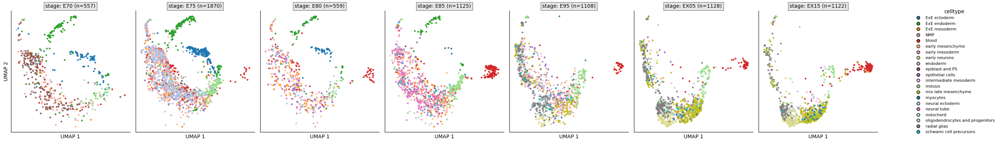

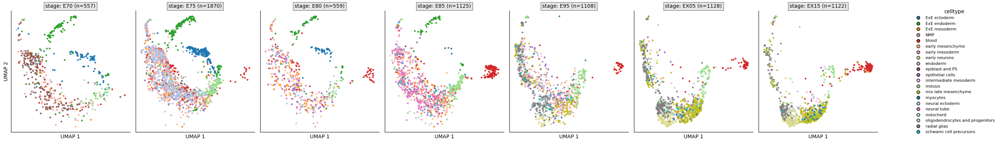

In [ ]:
#!/usr/bin/env python3
"""
UMAP plot colored by celltype and split by stage.
This script is adapted for execution in a Jupyter Notebook.
"""
# -----------------------------------------------------------------------------
# CELL 1: Imports
# -----------------------------------------------------------------------------
from __future__ import annotations
import json
from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import pandas as pd

# Prefer umap-learn; fallback to sklearn if needed
try:
    import umap
    UMAPImpl = 'umap-learn'
except ImportError:  # pragma: no cover
    umap = None
    from sklearn.manifold import TSNE  # type: ignore
    UMAPImpl = 'sklearn-TSNE'
    print("[info] umap-learn not found. Falling back to sklearn.manifold.TSNE.")
    print("[info] To install umap-learn, run: pip install umap-learn")


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors
from pathlib import Path

# -----------------------------------------------------------------------------
# CELL 2: Configuration and Parameters
# All settings that were previously command-line arguments are defined here.
# -----------------------------------------------------------------------------

# --- Paths ---
# Manually specify the root directory for your project
ROOT = Path("/home/duxuyan/Projects/schicluster_mac/31_svd_embedding").resolve()
DECOMP_DIR = ROOT / "output" / "decomp"
PLOT_OUT_DIR = ROOT / "plot" / "output"

# Input files
DEFAULT_EMBED_PATH = DECOMP_DIR / "total_decomp.npz"
LABELS_PATH = DECOMP_DIR / "cell_labels.csv"
CELL_TABLE_PATH = ROOT / "code" / "cell_table.tsv"
STAGE_MAP_PATH = Path(ROOT).parents[1] / "stage_files_mapping.csv"
COLOR_MAP_JSON = Path(ROOT).parents[1] / "5_plot_umap" / "color_mapping.json"

# --- UMAP/t-SNE Parameters ---
embedding_path = DEFAULT_EMBED_PATH
n_neighbors = 15
min_dist = 0.1

# --- Plotting Parameters ---
out_prefix = PLOT_OUT_DIR / "umap_celltype_split_stage"
point_size = 6.0
alpha = 0.9

# -----------------------------------------------------------------------------
# CELL 3: Helper Functions
# -----------------------------------------------------------------------------

def ensure_labels(labels_csv: Path = LABELS_PATH) -> pd.DataFrame:
    """Loads cell labels from CSV, or builds it from source files if it doesn't exist."""
    labels_csv.parent.mkdir(parents=True, exist_ok=True)
    if labels_csv.exists():
        df = pd.read_csv(labels_csv)
        needed = {"cell_id", "cellname", "stage", "celltype"}
        if needed.issubset(df.columns):
            return df
        # else rebuild if columns are missing

    print(f"'{labels_csv.name}' not found or is malformed. Rebuilding from source files...")
    # Build labels from sources
    cell_tbl = pd.read_csv(CELL_TABLE_PATH, sep='\t', header=None, names=["cell_id", "extra"], dtype=str)
    if "cell_id" not in cell_tbl.columns:
        raise RuntimeError(f"Unexpected cell_table format at {CELL_TABLE_PATH}")
    cell_tbl["cellname"] = cell_tbl["cell_id"]

    if not STAGE_MAP_PATH.exists():
        raise FileNotFoundError(f"Missing stage mapping CSV at {STAGE_MAP_PATH}")
    stage_map = pd.read_csv(STAGE_MAP_PATH)
    if "cellname" not in stage_map.columns:
        raise RuntimeError("stage_files_mapping.csv must contain 'cellname' column")

    merged = cell_tbl.merge(stage_map[["cellname", "stage", "celltype"]], on="cellname", how="left")
    missing = merged["celltype"].isna().sum()
    if missing > 0:
        print(f"[warn] {missing} rows missing celltype after merge; filling as 'unknown'")
        merged["celltype"].fillna("unknown", inplace=True)
    merged.to_csv(labels_csv, index=False)
    print(f"Labels successfully built and saved to '{labels_csv.name}'")
    return merged


def load_embeddings(npz_path: Path = DEFAULT_EMBED_PATH) -> np.ndarray:
    """Loads the embedding matrix from an .npz file."""
    if not npz_path.exists():
        raise FileNotFoundError(f"Embedding file not found: {npz_path}")
    with np.load(npz_path) as data:
        # Accept 'arr_0' or 'X' style keys for flexibility
        key = 'X' if 'X' in data.files else 'arr_0'
        X = data[key]
    if X.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {X.shape}")
    return X


def load_color_map() -> Dict[str, str]:
    """Loads a preferred color mapping from a JSON file if it exists."""
    if COLOR_MAP_JSON.exists():
        try:
            with open(COLOR_MAP_JSON, 'r') as f:
                cmap = json.load(f)
            # Handle nested dictionary format
            if isinstance(cmap, dict) and 'celltype' in cmap and isinstance(cmap['celltype'], dict):
                return cmap['celltype']
            if isinstance(cmap, dict) and all(isinstance(v, str) for v in cmap.values()):
                return cmap  # Simple mapping
        except Exception as e:
            print(f"[warn] Failed to read or parse color mapping JSON: {e}")
    return {} # Return empty dict if file doesn't exist or fails


def get_palette(categories: pd.Index, pref_map: Dict[str, str]) -> Dict[str, str]:
    """Generates a color palette, using a preferred map for specified categories."""
    cats = list(categories)
    palette = {}
    # Apply preferred mapping first
    palette.update(pref_map)
    # Generate colors for any remaining categories
    unmapped = [c for c in cats if c not in palette]
    if len(unmapped) > 0:
        # Use a well-distinguishable color palette
        colors = sns.color_palette("tab20", n_colors=max(20, len(unmapped)))
        for c, col in zip(unmapped, colors):
            palette[c] = mcolors.to_hex(col)
    return palette


def compute_2d(X: np.ndarray, n_neighbors: int, min_dist: float, random_state: int = 42) -> np.ndarray:
    """Computes 2D coordinates using UMAP or falls back to t-SNE."""
    print(f"Computing 2D embedding using {UMAPImpl}...")
    if umap is not None:
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
        coords = reducer.fit_transform(X)
    else:
        # Fallback to t-SNE if umap-learn is not installed
        tsne = TSNE(n_components=2, random_state=random_state, init='pca', learning_rate='auto', perplexity=min(30, X.shape[0]-1))
        coords = tsne.fit_transform(X)
    print("Computation complete.")
    return coords


def plot_umap_split_by_stage(
    coords: np.ndarray,
    labels: pd.DataFrame,
    color_by: str = "celltype",
    split_by: str = "stage",
    point_size: float = 6.0,
    alpha: float = 0.9,
    figsize: Tuple[int, int] = (14, 4),
    color_map: Optional[Dict[str, str]] = None,
) -> Tuple[plt.Figure, plt.Axes]:
    """Plots the UMAP, faceted by stage, and returns the figure object."""
    df = labels.copy().reset_index(drop=True)
    df["DIM1"], df["DIM2"] = coords[:, 0], coords[:, 1]
    dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "t-SNE"

    stages = sorted(df[split_by].dropna().unique().tolist())
    n_stage = len(stages)
    nrows, ncols = 1, max(1, n_stage)
    panel_w = max(3.5, min(5.0, figsize[0] / max(1, ncols)))
    figsize = (panel_w * ncols, figsize[1])

    if color_map is None:
        color_map = {}
    palette = get_palette(df[color_by].astype(str).unique(), color_map)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    for i, stage in enumerate(stages):
        ax = axes[i]
        sub = df[df[split_by] == stage]
        for ct, sub2 in sub.groupby(color_by):
            ax.scatter(sub2["DIM1"], sub2["DIM2"], s=point_size, alpha=alpha, c=palette.get(str(ct), "#888888"), label=str(ct))
        ax.set_title(
            f"{split_by}: {stage} (n={len(sub)})",
            fontsize=10,
            bbox=dict(facecolor='lightgray', alpha=0.5, pad=3)
        )
        ax.set_xlabel(f"{dim_prefix} 1")
        if i == 0:
            ax.set_ylabel(f"{dim_prefix} 2")
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)

        # Remove top and right spines for a cleaner look
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Create a single global legend
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], marker='o', color='none', label=lab, markerfacecolor=col, markersize=6)
               for lab, col in sorted(palette.items())] # Sort for consistent order

    fig.legend(handles=handles, title=color_by,
               loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False, fontsize=8)

    plt.tight_layout(rect=[0, 0, 0.98, 1])

    return fig, axes


# -----------------------------------------------------------------------------
# CELL 4: Main Execution Block
# -----------------------------------------------------------------------------

# Ensure the output directory exists
PLOT_OUT_DIR.mkdir(parents=True, exist_ok=True)

# 1. Load data
print("Loading data...")
labels_df = ensure_labels(LABELS_PATH)
embedding_matrix = load_embeddings(embedding_path)

if len(labels_df) != embedding_matrix.shape[0]:
    raise ValueError(f"Row count mismatch: labels {len(labels_df)} vs embedding {embedding_matrix.shape[0]}")

# 2. Compute 2D coordinates
coordinates = compute_2d(embedding_matrix, n_neighbors=n_neighbors, min_dist=min_dist)

# 3. Load preferred colors
preferred_colors = load_color_map()

# 4. Plot the results
print("Generating plot...")
fig, _ = plot_umap_split_by_stage(
    coordinates,
    labels_df,
    color_by="celltype",
    split_by="stage",
    point_size=point_size,
    alpha=alpha,
    color_map=preferred_colors
)

# 5. Save the output files
# out_png = Path(out_prefix).with_suffix('.png')
# out_pdf = Path(out_prefix).with_suffix('.pdf')
# out_csv = Path(out_prefix).with_suffix('.csv')

# fig.savefig(out_png, dpi=300, bbox_inches='tight')
# fig.savefig(out_pdf, bbox_inches='tight')

# out_df = labels_df.copy()
# dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "tSNE"
# out_df[f"{dim_prefix}1"] = coordinates[:, 0]
# out_df[f"{dim_prefix}2"] = coordinates[:, 1]
# out_df.to_csv(out_csv, index=False)

# print(f"\nOutputs successfully saved:")
# print(f"  - Plot (PNG): {out_png}")
# print(f"  - Plot (PDF): {out_pdf}")
# print(f"  - Coordinates (CSV): {out_csv}")

# 6. Display the plot directly in the notebook output
# In a Jupyter cell, having the figure object as the last line will render it.
fig



## 将每个 UMAP 子图的形状设置为长方形，即 UMAP1（宽度）方向比 UMAP2（高度）方向更短。

Loading data...
Computing 2D embedding using umap-learn...


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computation complete.
Generating plot...


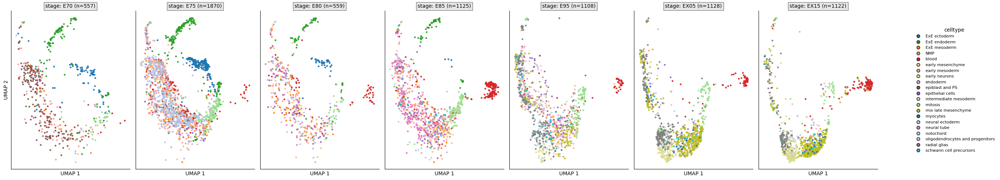

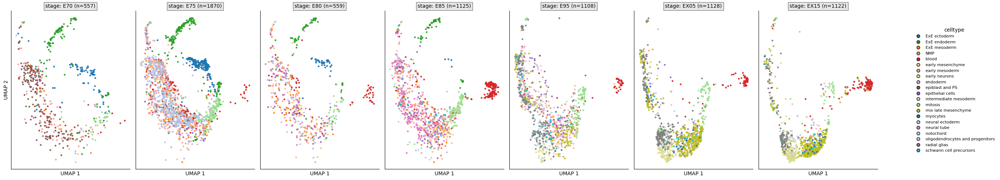

In [3]:
#!/usr/bin/env python3
"""
UMAP plot colored by celltype and split by stage.
This script is adapted for execution in a Jupyter Notebook.
"""
# -----------------------------------------------------------------------------
# CELL 1: Imports
# -----------------------------------------------------------------------------
from __future__ import annotations
import json
from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import pandas as pd

# Prefer umap-learn; fallback to sklearn if needed
try:
    import umap
    UMAPImpl = 'umap-learn'
except ImportError:  # pragma: no cover
    umap = None
    from sklearn.manifold import TSNE  # type: ignore
    UMAPImpl = 'sklearn-TSNE'
    print("[info] umap-learn not found. Falling back to sklearn.manifold.TSNE.")
    print("[info] To install umap-learn, run: pip install umap-learn")


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors
from pathlib import Path

# -----------------------------------------------------------------------------
# CELL 2: Configuration and Parameters
# All settings that were previously command-line arguments are defined here.
# -----------------------------------------------------------------------------

# --- Paths ---
# Manually specify the root directory for your project
ROOT = Path("/home/duxuyan/Projects/schicluster_mac/31_svd_embedding").resolve()
DECOMP_DIR = ROOT / "output" / "decomp"
PLOT_OUT_DIR = ROOT / "plot" / "output"

# Input files
DEFAULT_EMBED_PATH = DECOMP_DIR / "total_decomp.npz"
LABELS_PATH = DECOMP_DIR / "cell_labels.csv"
CELL_TABLE_PATH = ROOT / "code" / "cell_table.tsv"
STAGE_MAP_PATH = Path(ROOT).parents[1] / "stage_files_mapping.csv"
COLOR_MAP_JSON = Path(ROOT).parents[1] / "5_plot_umap" / "color_mapping.json"

# --- UMAP/t-SNE Parameters ---
embedding_path = DEFAULT_EMBED_PATH
n_neighbors = 15
min_dist = 0.1

# --- Plotting Parameters ---
out_prefix = PLOT_OUT_DIR / "umap_celltype_split_stage"
point_size = 6.0
alpha = 0.9

# -----------------------------------------------------------------------------
# CELL 3: Helper Functions
# -----------------------------------------------------------------------------

def ensure_labels(labels_csv: Path = LABELS_PATH) -> pd.DataFrame:
    """Loads cell labels from CSV, or builds it from source files if it doesn't exist."""
    labels_csv.parent.mkdir(parents=True, exist_ok=True)
    if labels_csv.exists():
        df = pd.read_csv(labels_csv)
        needed = {"cell_id", "cellname", "stage", "celltype"}
        if needed.issubset(df.columns):
            return df
        # else rebuild if columns are missing

    print(f"'{labels_csv.name}' not found or is malformed. Rebuilding from source files...")
    # Build labels from sources
    cell_tbl = pd.read_csv(CELL_TABLE_PATH, sep='\t', header=None, names=["cell_id", "extra"], dtype=str)
    if "cell_id" not in cell_tbl.columns:
        raise RuntimeError(f"Unexpected cell_table format at {CELL_TABLE_PATH}")
    cell_tbl["cellname"] = cell_tbl["cell_id"]

    if not STAGE_MAP_PATH.exists():
        raise FileNotFoundError(f"Missing stage mapping CSV at {STAGE_MAP_PATH}")
    stage_map = pd.read_csv(STAGE_MAP_PATH)
    if "cellname" not in stage_map.columns:
        raise RuntimeError("stage_files_mapping.csv must contain 'cellname' column")

    merged = cell_tbl.merge(stage_map[["cellname", "stage", "celltype"]], on="cellname", how="left")
    missing = merged["celltype"].isna().sum()
    if missing > 0:
        print(f"[warn] {missing} rows missing celltype after merge; filling as 'unknown'")
        merged["celltype"].fillna("unknown", inplace=True)
    merged.to_csv(labels_csv, index=False)
    print(f"Labels successfully built and saved to '{labels_csv.name}'")
    return merged


def load_embeddings(npz_path: Path = DEFAULT_EMBED_PATH) -> np.ndarray:
    """Loads the embedding matrix from an .npz file."""
    if not npz_path.exists():
        raise FileNotFoundError(f"Embedding file not found: {npz_path}")
    with np.load(npz_path) as data:
        # Accept 'arr_0' or 'X' style keys for flexibility
        key = 'X' if 'X' in data.files else 'arr_0'
        X = data[key]
    if X.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {X.shape}")
    return X


def load_color_map() -> Dict[str, str]:
    """Loads a preferred color mapping from a JSON file if it exists."""
    if COLOR_MAP_JSON.exists():
        try:
            with open(COLOR_MAP_JSON, 'r') as f:
                cmap = json.load(f)
            # Handle nested dictionary format
            if isinstance(cmap, dict) and 'celltype' in cmap and isinstance(cmap['celltype'], dict):
                return cmap['celltype']
            if isinstance(cmap, dict) and all(isinstance(v, str) for v in cmap.values()):
                return cmap  # Simple mapping
        except Exception as e:
            print(f"[warn] Failed to read or parse color mapping JSON: {e}")
    return {} # Return empty dict if file doesn't exist or fails


def get_palette(categories: pd.Index, pref_map: Dict[str, str]) -> Dict[str, str]:
    """Generates a color palette, using a preferred map for specified categories."""
    cats = list(categories)
    palette = {}
    # Apply preferred mapping first
    palette.update(pref_map)
    # Generate colors for any remaining categories
    unmapped = [c for c in cats if c not in palette]
    if len(unmapped) > 0:
        # Use a well-distinguishable color palette
        colors = sns.color_palette("tab20", n_colors=max(20, len(unmapped)))
        for c, col in zip(unmapped, colors):
            palette[c] = mcolors.to_hex(col)
    return palette


def compute_2d(X: np.ndarray, n_neighbors: int, min_dist: float, random_state: int = 42) -> np.ndarray:
    """Computes 2D coordinates using UMAP or falls back to t-SNE."""
    print(f"Computing 2D embedding using {UMAPImpl}...")
    if umap is not None:
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
        coords = reducer.fit_transform(X)
    else:
        # Fallback to t-SNE if umap-learn is not installed
        tsne = TSNE(n_components=2, random_state=random_state, init='pca', learning_rate='auto', perplexity=min(30, X.shape[0]-1))
        coords = tsne.fit_transform(X)
    print("Computation complete.")
    return coords


def plot_umap_split_by_stage(
    coords: np.ndarray,
    labels: pd.DataFrame,
    color_by: str = "celltype",
    split_by: str = "stage",
    point_size: float = 6.0,
    alpha: float = 0.9,
    figsize: Tuple[int, int] = (14, 4),
    color_map: Optional[Dict[str, str]] = None,
) -> Tuple[plt.Figure, plt.Axes]:
    """Plots the UMAP, faceted by stage, and returns the figure object."""
    df = labels.copy().reset_index(drop=True)
    df["DIM1"], df["DIM2"] = coords[:, 0], coords[:, 1]
    dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "t-SNE"

    stages = sorted(df[split_by].dropna().unique().tolist())
    n_stage = len(stages)
    nrows, ncols = 1, max(1, n_stage)
    
    # Make each panel rectangular: width (UMAP1) shorter than height (UMAP2).
    panel_h = 5.0  # Set a fixed height for each panel
    panel_w = 3.5  # Set a shorter width for each panel
    figsize = (panel_w * ncols, panel_h) # Calculate total figure size

    if color_map is None:
        color_map = {}
    palette = get_palette(df[color_by].astype(str).unique(), color_map)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    for i, stage in enumerate(stages):
        ax = axes[i]
        sub = df[df[split_by] == stage]
        for ct, sub2 in sub.groupby(color_by):
            ax.scatter(sub2["DIM1"], sub2["DIM2"], s=point_size, alpha=alpha, c=palette.get(str(ct), "#888888"), label=str(ct))
        ax.set_title(
            f"{split_by}: {stage} (n={len(sub)})",
            fontsize=10,
            bbox=dict(facecolor='lightgray', alpha=0.5, pad=3)
        )
        ax.set_xlabel(f"{dim_prefix} 1")
        if i == 0:
            ax.set_ylabel(f"{dim_prefix} 2")
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)

        # Remove top and right spines for a cleaner look
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Create a single global legend
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], marker='o', color='none', label=lab, markerfacecolor=col, markersize=6)
               for lab, col in sorted(palette.items())] # Sort for consistent order

    fig.legend(handles=handles, title=color_by,
               loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False, fontsize=8)

    plt.tight_layout(rect=[0, 0, 0.98, 1])

    return fig, axes


# -----------------------------------------------------------------------------
# CELL 4: Main Execution Block
# -----------------------------------------------------------------------------

# Ensure the output directory exists
PLOT_OUT_DIR.mkdir(parents=True, exist_ok=True)

# 1. Load data
print("Loading data...")
labels_df = ensure_labels(LABELS_PATH)
embedding_matrix = load_embeddings(embedding_path)

if len(labels_df) != embedding_matrix.shape[0]:
    raise ValueError(f"Row count mismatch: labels {len(labels_df)} vs embedding {embedding_matrix.shape[0]}")

# 2. Compute 2D coordinates
coordinates = compute_2d(embedding_matrix, n_neighbors=n_neighbors, min_dist=min_dist)

# 3. Load preferred colors
preferred_colors = load_color_map()

# 4. Plot the results
print("Generating plot...")
fig, _ = plot_umap_split_by_stage(
    coordinates,
    labels_df,
    color_by="celltype",
    split_by="stage",
    point_size=point_size,
    alpha=alpha,
    color_map=preferred_colors
)

# 5. Save the output files
# out_png = Path(out_prefix).with_suffix('.png')
# out_pdf = Path(out_prefix).with_suffix('.pdf')
# out_csv = Path(out_prefix).with_suffix('.csv')

# fig.savefig(out_png, dpi=300, bbox_inches='tight')
# fig.savefig(out_pdf, bbox_inches='tight')

# out_df = labels_df.copy()
# dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "tSNE"
# out_df[f"{dim_prefix}1"] = coordinates[:, 0]
# out_df[f"{dim_prefix}2"] = coordinates[:, 1]
# out_df.to_csv(out_csv, index=False)

# print(f"\nOutputs successfully saved:")
# print(f"  - Plot (PNG): {out_png}")
# print(f"  - Plot (PDF): {out_pdf}")
# print(f"  - Coordinates (CSV): {out_csv}")

# 6. Display the plot directly in the notebook output
# In a Jupyter cell, having the figure object as the last line will render it.
fig



## 在保持子图标题现有功能的基础上，将其灰色背景调整得更宽、更长，使其宽度与 UMAP 子图的宽度完全一致，并使用浅灰色。

Loading data...
Computing 2D embedding using umap-learn...


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computation complete.
Generating plot...


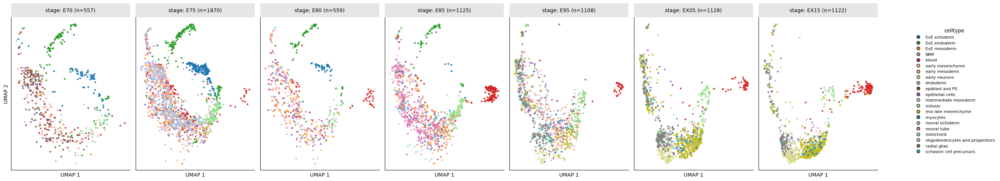

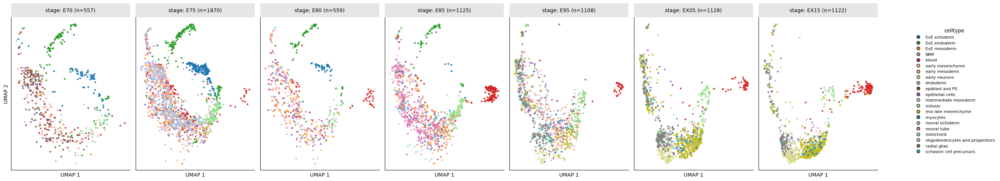

In [4]:
#!/usr/bin/env python3
"""
UMAP plot colored by celltype and split by stage.
This script is adapted for execution in a Jupyter Notebook.
"""
# -----------------------------------------------------------------------------
# CELL 1: Imports
# -----------------------------------------------------------------------------
from __future__ import annotations
import json
from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import pandas as pd

# Prefer umap-learn; fallback to sklearn if needed
try:
    import umap
    UMAPImpl = 'umap-learn'
except ImportError:  # pragma: no cover
    umap = None
    from sklearn.manifold import TSNE  # type: ignore
    UMAPImpl = 'sklearn-TSNE'
    print("[info] umap-learn not found. Falling back to sklearn.manifold.TSNE.")
    print("[info] To install umap-learn, run: pip install umap-learn")


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors
from matplotlib.patches import Rectangle
from pathlib import Path

# -----------------------------------------------------------------------------
# CELL 2: Configuration and Parameters
# All settings that were previously command-line arguments are defined here.
# -----------------------------------------------------------------------------

# --- Paths ---
# Manually specify the root directory for your project
ROOT = Path("/home/duxuyan/Projects/schicluster_mac/31_svd_embedding").resolve()
DECOMP_DIR = ROOT / "output" / "decomp"
PLOT_OUT_DIR = ROOT / "plot" / "output"

# Input files
DEFAULT_EMBED_PATH = DECOMP_DIR / "total_decomp.npz"
LABELS_PATH = DECOMP_DIR / "cell_labels.csv"
CELL_TABLE_PATH = ROOT / "code" / "cell_table.tsv"
STAGE_MAP_PATH = Path(ROOT).parents[1] / "stage_files_mapping.csv"
COLOR_MAP_JSON = Path(ROOT).parents[1] / "5_plot_umap" / "color_mapping.json"

# --- UMAP/t-SNE Parameters ---
embedding_path = DEFAULT_EMBED_PATH
n_neighbors = 15
min_dist = 0.1

# --- Plotting Parameters ---
out_prefix = PLOT_OUT_DIR / "umap_celltype_split_stage"
point_size = 6.0
alpha = 0.9

# -----------------------------------------------------------------------------
# CELL 3: Helper Functions
# -----------------------------------------------------------------------------

def ensure_labels(labels_csv: Path = LABELS_PATH) -> pd.DataFrame:
    """Loads cell labels from CSV, or builds it from source files if it doesn't exist."""
    labels_csv.parent.mkdir(parents=True, exist_ok=True)
    if labels_csv.exists():
        df = pd.read_csv(labels_csv)
        needed = {"cell_id", "cellname", "stage", "celltype"}
        if needed.issubset(df.columns):
            return df
        # else rebuild if columns are missing

    print(f"'{labels_csv.name}' not found or is malformed. Rebuilding from source files...")
    # Build labels from sources
    cell_tbl = pd.read_csv(CELL_TABLE_PATH, sep='\t', header=None, names=["cell_id", "extra"], dtype=str)
    if "cell_id" not in cell_tbl.columns:
        raise RuntimeError(f"Unexpected cell_table format at {CELL_TABLE_PATH}")
    cell_tbl["cellname"] = cell_tbl["cell_id"]

    if not STAGE_MAP_PATH.exists():
        raise FileNotFoundError(f"Missing stage mapping CSV at {STAGE_MAP_PATH}")
    stage_map = pd.read_csv(STAGE_MAP_PATH)
    if "cellname" not in stage_map.columns:
        raise RuntimeError("stage_files_mapping.csv must contain 'cellname' column")

    merged = cell_tbl.merge(stage_map[["cellname", "stage", "celltype"]], on="cellname", how="left")
    missing = merged["celltype"].isna().sum()
    if missing > 0:
        print(f"[warn] {missing} rows missing celltype after merge; filling as 'unknown'")
        merged["celltype"].fillna("unknown", inplace=True)
    merged.to_csv(labels_csv, index=False)
    print(f"Labels successfully built and saved to '{labels_csv.name}'")
    return merged


def load_embeddings(npz_path: Path = DEFAULT_EMBED_PATH) -> np.ndarray:
    """Loads the embedding matrix from an .npz file."""
    if not npz_path.exists():
        raise FileNotFoundError(f"Embedding file not found: {npz_path}")
    with np.load(npz_path) as data:
        # Accept 'arr_0' or 'X' style keys for flexibility
        key = 'X' if 'X' in data.files else 'arr_0'
        X = data[key]
    if X.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {X.shape}")
    return X


def load_color_map() -> Dict[str, str]:
    """Loads a preferred color mapping from a JSON file if it exists."""
    if COLOR_MAP_JSON.exists():
        try:
            with open(COLOR_MAP_JSON, 'r') as f:
                cmap = json.load(f)
            # Handle nested dictionary format
            if isinstance(cmap, dict) and 'celltype' in cmap and isinstance(cmap['celltype'], dict):
                return cmap['celltype']
            if isinstance(cmap, dict) and all(isinstance(v, str) for v in cmap.values()):
                return cmap  # Simple mapping
        except Exception as e:
            print(f"[warn] Failed to read or parse color mapping JSON: {e}")
    return {} # Return empty dict if file doesn't exist or fails


def get_palette(categories: pd.Index, pref_map: Dict[str, str]) -> Dict[str, str]:
    """Generates a color palette, using a preferred map for specified categories."""
    cats = list(categories)
    palette = {}
    # Apply preferred mapping first
    palette.update(pref_map)
    # Generate colors for any remaining categories
    unmapped = [c for c in cats if c not in palette]
    if len(unmapped) > 0:
        # Use a well-distinguishable color palette
        colors = sns.color_palette("tab20", n_colors=max(20, len(unmapped)))
        for c, col in zip(unmapped, colors):
            palette[c] = mcolors.to_hex(col)
    return palette


def compute_2d(X: np.ndarray, n_neighbors: int, min_dist: float, random_state: int = 42) -> np.ndarray:
    """Computes 2D coordinates using UMAP or falls back to t-SNE."""
    print(f"Computing 2D embedding using {UMAPImpl}...")
    if umap is not None:
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
        coords = reducer.fit_transform(X)
    else:
        # Fallback to t-SNE if umap-learn is not installed
        tsne = TSNE(n_components=2, random_state=random_state, init='pca', learning_rate='auto', perplexity=min(30, X.shape[0]-1))
        coords = tsne.fit_transform(X)
    print("Computation complete.")
    return coords


def plot_umap_split_by_stage(
    coords: np.ndarray,
    labels: pd.DataFrame,
    color_by: str = "celltype",
    split_by: str = "stage",
    point_size: float = 6.0,
    alpha: float = 0.9,
    figsize: Tuple[int, int] = (14, 4),
    color_map: Optional[Dict[str, str]] = None,
) -> Tuple[plt.Figure, plt.Axes]:
    """Plots the UMAP, faceted by stage, and returns the figure object."""
    df = labels.copy().reset_index(drop=True)
    df["DIM1"], df["DIM2"] = coords[:, 0], coords[:, 1]
    dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "t-SNE"

    stages = sorted(df[split_by].dropna().unique().tolist())
    n_stage = len(stages)
    nrows, ncols = 1, max(1, n_stage)
    
    # Make each panel rectangular: width (UMAP1) shorter than height (UMAP2).
    panel_h = 5.0  # Set a fixed height for each panel
    panel_w = 3.5  # Set a shorter width for each panel
    figsize = (panel_w * ncols, panel_h) # Calculate total figure size

    if color_map is None:
        color_map = {}
    palette = get_palette(df[color_by].astype(str).unique(), color_map)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    for i, stage in enumerate(stages):
        ax = axes[i]
        sub = df[df[split_by] == stage]
        for ct, sub2 in sub.groupby(color_by):
            ax.scatter(sub2["DIM1"], sub2["DIM2"], s=point_size, alpha=alpha, c=palette.get(str(ct), "#888888"), label=str(ct))
        
        # --- New Title with Full-Width Background ---
        # Define background properties
        bg_y = 1.0
        bg_height = 0.09 # Adjusted height
        
        # Add the rectangle patch, spanning the full width
        rect = Rectangle((0, bg_y), 1, bg_height,
                         transform=ax.transAxes,
                         facecolor='#E0E0E0',  # A light grey color
                         alpha=0.8,
                         edgecolor='none',
                         clip_on=False)
        ax.add_patch(rect)

        # Add the title text centered within the background patch
        title_text = f"{split_by}: {stage} (n={len(sub)})"
        ax.text(0.5, bg_y + bg_height / 2.0, title_text,
                transform=ax.transAxes,
                ha='center',
                va='center',
                fontsize=10,
                clip_on=False)

        ax.set_xlabel(f"{dim_prefix} 1")
        if i == 0:
            ax.set_ylabel(f"{dim_prefix} 2")
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)

        # Remove top and right spines for a cleaner look
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Create a single global legend
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], marker='o', color='none', label=lab, markerfacecolor=col, markersize=6)
               for lab, col in sorted(palette.items())] # Sort for consistent order

    fig.legend(handles=handles, title=color_by,
               loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False, fontsize=8)

    plt.tight_layout(rect=[0, 0, 0.98, 1])

    return fig, axes


# -----------------------------------------------------------------------------
# CELL 4: Main Execution Block
# -----------------------------------------------------------------------------

# Ensure the output directory exists
PLOT_OUT_DIR.mkdir(parents=True, exist_ok=True)

# 1. Load data
print("Loading data...")
labels_df = ensure_labels(LABELS_PATH)
embedding_matrix = load_embeddings(embedding_path)

if len(labels_df) != embedding_matrix.shape[0]:
    raise ValueError(f"Row count mismatch: labels {len(labels_df)} vs embedding {embedding_matrix.shape[0]}")

# 2. Compute 2D coordinates
coordinates = compute_2d(embedding_matrix, n_neighbors=n_neighbors, min_dist=min_dist)

# 3. Load preferred colors
preferred_colors = load_color_map()

# 4. Plot the results
print("Generating plot...")
fig, _ = plot_umap_split_by_stage(
    coordinates,
    labels_df,
    color_by="celltype",
    split_by="stage",
    point_size=point_size,
    alpha=alpha,
    color_map=preferred_colors
)

# 5. Save the output files
out_png = Path(out_prefix).with_suffix('.png')
# out_pdf = Path(out_prefix).with_suffix('.pdf')
# out_csv = Path(out_prefix).with_suffix('.csv')

# fig.savefig(out_png, dpi=300, bbox_inches='tight')
# fig.savefig(out_pdf, bbox_inches='tight')

# out_df = labels_df.copy()
# dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "tSNE"
# out_df[f"{dim_prefix}1"] = coordinates[:, 0]
# out_df[f"{dim_prefix}2"] = coordinates[:, 1]
# out_df.to_csv(out_csv, index=False)

# print(f"\nOutputs successfully saved:")
# print(f"  - Plot (PNG): {out_png}")
# print(f"  - Plot (PDF): {out_pdf}")
# print(f"  - Coordinates (CSV): {out_csv}")

# 6. Display the plot directly in the notebook output
# In a Jupyter cell, having the figure object as the last line will render it.
fig



## 我将修改您 Canvas 中的 Python 脚本，以实现以下视觉效果：

坐标轴和边框：只有第一个 UMAP 子图会显示左侧和底部的边框，并同时标注 UMAP1 和 UMAP2。所有后续的子图将只保留底部边框和 UMAP1 标签。

字体大小：我将引入一个统一的变量来控制图中所有文本（标题、坐标轴标签）的字体大小，使其更易于调整。图例的字体大小也将由一个单独的变量控制。



In [ ]:
#!/usr/bin/env python3
"""
UMAP plot colored by celltype and split by stage.
This script is adapted for execution in a Jupyter Notebook.
"""
# -----------------------------------------------------------------------------
# CELL 1: Imports
# -----------------------------------------------------------------------------
from __future__ import annotations
import json
from pathlib import Path
from typing import Dict, Optional, Tuple

import numpy as np
import pandas as pd

# Prefer umap-learn; fallback to sklearn if needed
try:
    import umap
    UMAPImpl = 'umap-learn'
except ImportError:  # pragma: no cover
    umap = None
    from sklearn.manifold import TSNE  # type: ignore
    UMAPImpl = 'sklearn-TSNE'
    print("[info] umap-learn not found. Falling back to sklearn.manifold.TSNE.")
    print("[info] To install umap-learn, run: pip install umap-learn")


import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors
from matplotlib.patches import Rectangle
from pathlib import Path

# -----------------------------------------------------------------------------
# CELL 2: Configuration and Parameters
# All settings that were previously command-line arguments are defined here.
# -----------------------------------------------------------------------------

# --- Paths ---
# Manually specify the root directory for your project
ROOT = Path("/home/duxuyan/Projects/schicluster_mac/31_svd_embedding").resolve()
DECOMP_DIR = ROOT / "output" / "decomp"
PLOT_OUT_DIR = ROOT / "plot" / "output"

# Input files
DEFAULT_EMBED_PATH = DECOMP_DIR / "total_decomp.npz"
LABELS_PATH = DECOMP_DIR / "cell_labels.csv"
CELL_TABLE_PATH = ROOT / "code" / "cell_table.tsv"
STAGE_MAP_PATH = Path(ROOT).parents[1] / "stage_files_mapping.csv"
COLOR_MAP_JSON = Path(ROOT).parents[1] / "5_plot_umap" / "color_mapping.json"

# --- UMAP/t-SNE Parameters ---
embedding_path = DEFAULT_EMBED_PATH
n_neighbors = 15
min_dist = 0.1

# --- Plotting Parameters ---
out_prefix = PLOT_OUT_DIR / "umap_celltype_split_stage"
point_size = 6 # 6.0
alpha = 0.9
base_fontsize = 16
legend_fontsize = 10

# -----------------------------------------------------------------------------
# CELL 3: Helper Functions
# -----------------------------------------------------------------------------

def ensure_labels(labels_csv: Path = LABELS_PATH) -> pd.DataFrame:
    """Loads cell labels from CSV, or builds it from source files if it doesn't exist."""
    labels_csv.parent.mkdir(parents=True, exist_ok=True)
    if labels_csv.exists():
        df = pd.read_csv(labels_csv)
        needed = {"cell_id", "cellname", "stage", "celltype"}
        if needed.issubset(df.columns):
            return df
        # else rebuild if columns are missing

    print(f"'{labels_csv.name}' not found or is malformed. Rebuilding from source files...")
    # Build labels from sources
    cell_tbl = pd.read_csv(CELL_TABLE_PATH, sep='\t', header=None, names=["cell_id", "extra"], dtype=str)
    if "cell_id" not in cell_tbl.columns:
        raise RuntimeError(f"Unexpected cell_table format at {CELL_TABLE_PATH}")
    cell_tbl["cellname"] = cell_tbl["cell_id"]

    if not STAGE_MAP_PATH.exists():
        raise FileNotFoundError(f"Missing stage mapping CSV at {STAGE_MAP_PATH}")
    stage_map = pd.read_csv(STAGE_MAP_PATH)
    if "cellname" not in stage_map.columns:
        raise RuntimeError("stage_files_mapping.csv must contain 'cellname' column")

    merged = cell_tbl.merge(stage_map[["cellname", "stage", "celltype"]], on="cellname", how="left")
    missing = merged["celltype"].isna().sum()
    if missing > 0:
        print(f"[warn] {missing} rows missing celltype after merge; filling as 'unknown'")
        merged["celltype"].fillna("unknown", inplace=True)
    merged.to_csv(labels_csv, index=False)
    print(f"Labels successfully built and saved to '{labels_csv.name}'")
    return merged


def load_embeddings(npz_path: Path = DEFAULT_EMBED_PATH) -> np.ndarray:
    """Loads the embedding matrix from an .npz file."""
    if not npz_path.exists():
        raise FileNotFoundError(f"Embedding file not found: {npz_path}")
    with np.load(npz_path) as data:
        # Accept 'arr_0' or 'X' style keys for flexibility
        key = 'X' if 'X' in data.files else 'arr_0'
        X = data[key]
    if X.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {X.shape}")
    return X


def load_color_map() -> Dict[str, str]:
    """Loads a preferred color mapping from a JSON file if it exists."""
    if COLOR_MAP_JSON.exists():
        try:
            with open(COLOR_MAP_JSON, 'r') as f:
                cmap = json.load(f)
            # Handle nested dictionary format
            if isinstance(cmap, dict) and 'celltype' in cmap and isinstance(cmap['celltype'], dict):
                return cmap['celltype']
            if isinstance(cmap, dict) and all(isinstance(v, str) for v in cmap.values()):
                return cmap  # Simple mapping
        except Exception as e:
            print(f"[warn] Failed to read or parse color mapping JSON: {e}")
    return {} # Return empty dict if file doesn't exist or fails


def get_palette(categories: pd.Index, pref_map: Dict[str, str]) -> Dict[str, str]:
    """Generates a color palette, using a preferred map for specified categories."""
    cats = list(categories)
    palette = {}
    # Apply preferred mapping first
    palette.update(pref_map)
    # Generate colors for any remaining categories
    unmapped = [c for c in cats if c not in palette]
    if len(unmapped) > 0:
        # Use a well-distinguishable color palette
        colors = sns.color_palette("tab20", n_colors=max(20, len(unmapped)))
        for c, col in zip(unmapped, colors):
            palette[c] = mcolors.to_hex(col)
    return palette


def compute_2d(X: np.ndarray, n_neighbors: int, min_dist: float, random_state: int = 42) -> np.ndarray:
    """Computes 2D coordinates using UMAP or falls back to t-SNE."""
    print(f"Computing 2D embedding using {UMAPImpl}...")
    if umap is not None:
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
        coords = reducer.fit_transform(X)
    else:
        # Fallback to t-SNE if umap-learn is not installed
        tsne = TSNE(n_components=2, random_state=random_state, init='pca', learning_rate='auto', perplexity=min(30, X.shape[0]-1))
        coords = tsne.fit_transform(X)
    print("Computation complete.")
    return coords


def plot_umap_split_by_stage(
    coords: np.ndarray,
    labels: pd.DataFrame,
    color_by: str = "celltype",
    split_by: str = "stage",
    point_size: float = 6.0,
    alpha: float = 0.9,
    figsize: Tuple[int, int] = (14, 4),
    color_map: Optional[Dict[str, str]] = None,
    base_fontsize: int = 12,
    legend_fontsize: int = 9,
) -> Tuple[plt.Figure, plt.Axes]:
    """Plots the UMAP, faceted by stage, and returns the figure object."""
    df = labels.copy().reset_index(drop=True)
    df["DIM1"], df["DIM2"] = coords[:, 0], coords[:, 1]
    dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "t-SNE"

    stages = sorted(df[split_by].dropna().unique().tolist())
    n_stage = len(stages)
    nrows, ncols = 1, max(1, n_stage)
    
    # Make each panel rectangular: width (UMAP1) shorter than height (UMAP2).
    panel_h = 5.0  # Set a fixed height for each panel
    panel_w = 3.5  # Set a shorter width for each panel
    figsize = (panel_w * ncols, panel_h) # Calculate total figure size

    if color_map is None:
        color_map = {}
    palette = get_palette(df[color_by].astype(str).unique(), color_map)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    for i, stage in enumerate(stages):
        ax = axes[i]
        sub = df[df[split_by] == stage]
        for ct, sub2 in sub.groupby(color_by):
            ax.scatter(sub2["DIM1"], sub2["DIM2"], s=point_size, alpha=alpha, c=palette.get(str(ct), "#888888"), label=str(ct))
        
        # --- New Title with Full-Width Background ---
        # Define background properties
        bg_y = 1.0
        bg_height = 0.09 # Adjusted height
        
        # Add the rectangle patch, spanning the full width
        rect = Rectangle((0, bg_y), 1, bg_height,
                         transform=ax.transAxes,
                         facecolor='#E0E0E0',  # A light grey color
                         alpha=0.8,
                         edgecolor='none',
                         clip_on=False)
        ax.add_patch(rect)

        # Add the title text centered within the background patch
        title_text = f"{split_by}: {stage} (n={len(sub)})"
        ax.text(0.5, bg_y + bg_height / 2.0, title_text,
                transform=ax.transAxes,
                ha='center',
                va='center',
                fontsize=base_fontsize,
                clip_on=False)

        ax.set_xlabel(f"{dim_prefix} 1", fontsize=base_fontsize)
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)

        # --- Conditional Axes and Spines ---
        # Hide all spines first by default
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        # Keep bottom spine for all plots
        ax.spines['bottom'].set_visible(True)

        if i == 0:
            # First subplot: show left spine and Y label
            ax.spines['left'].set_visible(True)
            ax.set_ylabel(f"{dim_prefix} 2", fontsize=base_fontsize)
        else:
            # Other subplots: hide Y label
            ax.set_ylabel("")

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Create a single global legend
    from matplotlib.lines import Line2D
    handles = [Line2D([0], [0], marker='o', color='none', label=lab, markerfacecolor=col, markersize=6)
               for lab, col in sorted(palette.items())] # Sort for consistent order

    fig.legend(handles=handles, title=color_by,
               loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False, fontsize=legend_fontsize)

    plt.tight_layout(rect=[0, 0, 0.98, 1])

    return fig, axes


# -----------------------------------------------------------------------------
# CELL 4: Main Execution Block
# -----------------------------------------------------------------------------

# Ensure the output directory exists
PLOT_OUT_DIR.mkdir(parents=True, exist_ok=True)

# 1. Load data
print("Loading data...")
labels_df = ensure_labels(LABELS_PATH)
embedding_matrix = load_embeddings(embedding_path)

if len(labels_df) != embedding_matrix.shape[0]:
    raise ValueError(f"Row count mismatch: labels {len(labels_df)} vs embedding {embedding_matrix.shape[0]}")

# 2. Compute 2D coordinates
coordinates = compute_2d(embedding_matrix, n_neighbors=n_neighbors, min_dist=min_dist)

# 3. Load preferred colors
preferred_colors = load_color_map()

# 4. Plot the results
print("Generating plot...")
fig, _ = plot_umap_split_by_stage(
    coordinates,
    labels_df,
    color_by="celltype",
    split_by="stage",
    point_size=point_size,
    alpha=alpha,
    color_map=preferred_colors,
    base_fontsize=base_fontsize,
    legend_fontsize=legend_fontsize
)

# 5. Save the output files
# out_png = Path(out_prefix).with_suffix('.png')
# out_pdf = Path(out_prefix).with_suffix('.pdf')
# out_csv = Path(out_prefix).with_suffix('.csv')

# fig.savefig(out_png, dpi=300, bbox_inches='tight')
# fig.savefig(out_pdf, bbox_inches='tight')

# out_df = labels_df.copy()
# dim_prefix = "UMAP" if UMAPImpl == 'umap-learn' else "tSNE"
# out_df[f"{dim_prefix}1"] = coordinates[:, 0]
# out_df[f"{dim_prefix}2"] = coordinates[:, 1]
# out_df.to_csv(out_csv, index=False)

# print(f"\nOutputs successfully saved:")
# print(f"  - Plot (PNG): {out_png}")
# print(f"  - Plot (PDF): {out_pdf}")
# print(f"  - Coordinates (CSV): {out_csv}")

# 6. Display the plot directly in the notebook output
# In a Jupyter cell, having the figure object as the last line will render it.
fig


Loading data...
Computing 2D embedding using umap-learn...


/home/duxuyan/micromamba/envs/3_schicluster_python38/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
